In [16]:
from ario3.simulation import Simulation
from ario3.indicators import Indicators
import json
import pandas as pd
import numpy as np
import pathlib
import csv

params = { "storage_dir": "BigScaleTest",
            "results_storage": "results",
            "bool_run_detailled": True,
            "register_stocks": True,
            "psi_param": 0.9,
            "model_time_step": 1,
            "timestep_dividing_factor": 100,
            "inventory_restoration_time": 40,
            "alpha_base": 1.0,
            "alpha_max": 1.25,
            "alpha_tau": 365,
            "rebuild_tau": 90,
            "n_timesteps": 500,
            "min_duration": (150 // 100) * 25,
            "impacted_region_base_production_toward_rebuilding": 0.002,
            "row_base_production_toward_rebuilding": 0.0,
            "mrio_params_file":"/home/sjuhel/Nextcloud/Thesis/Workbench/Code/ARIO3/BigScaleTest/mrio_params.json"
}

event_template = {
        "aff-regions": [
            "FR"
        ],
        "aff-sectors": [
            'Mining of coal and lignite; extraction of peat (10)',
            'Extraction of crude petroleum and services related to crude oil extraction, excluding surveying',
            'Extraction of natural gas and services related to natural gas extraction, excluding surveying',
            'Extraction, liquefaction, and regasification of other petroleum and gaseous materials',
            'Mining of uranium and thorium ores (12)',
            'Mining of iron ores',
            'Mining of copper ores and concentrates',
            'Mining of nickel ores and concentrates',
            'Mining of aluminium ores and concentrates',
            'Mining of precious metal ores and concentrates',
            'Mining of lead, zinc and tin ores and concentrates',
            'Mining of other non-ferrous metal ores and concentrates', 
            'Quarrying',
            'Manufacture of textiles (17)',
            'Manufacture of wearing apparel; dressing and dyeing of fur (18)',
            'Manufacture of wood and of products of wood and cork, except furniture; manufacture of articles of straw and plaiting materials (20)',
            'Manufacture of coke oven products',
            'Petroleum Refinery',
            'Processing of nuclear fuel',
            'Plastics, basic',
            'Fertilisers',
            'Chemicals nec',
            'Manufacture of rubber and plastic products (25)',
            'Manufacture of glass and glass products',
            'Manufacture of ceramic goods',
            'Manufacture of construction products and cement',
            'Manufacture of other non-metallic mineral products n.e.c.',
            'Manufacture of basic iron and steel and of ferro-alloys and first products thereof',
            'Precious metals production', 
            'Aluminium production',
            'Lead, zinc and tin production', 
            'Copper production',
            'Other non-ferrous metal production',
            'Casting of metals',
            'Manufacture of fabricated metal products, except machinery and equipment (28)',
            'Manufacture of machinery and equipment n.e.c. (29)',
            'Manufacture of office machinery and computers (30)',
            'Manufacture of electrical machinery and apparatus n.e.c. (31)',
            'Manufacture of medical, precision and optical instruments, watches and clocks (33)',
            'Manufacture of transport equipment (34,35)',
            'Manufacture of furniture; manufacturing n.e.c. (36)',
            'Recycling of waste and scrap',
            'Transmission and distribution of electricity',
            'Transport via railways',
            'Other land transport',
            'Post and telecommunications (64)'
        ],
        "dmg-distrib-regions": [
            1
        ],
        "dmg-distrib-sectors-type": "gdp",
        "dmg-distrib-sectors": [],
        "duration": 1,
        "name": "0",
        "occur": 5,
        "q_dmg": 100000000,
        "rebuilding-sectors": {
            "Construction (45)":0.15,
            "Manufacture of machinery and equipment n.e.c. (29)" : 0.20,
            "Manufacture of furniture; manufacturing n.e.c. (36)" : 0.20,
            "Manufacture of office machinery and computers (30)": 0.15,
            "Manufacture of medical, precision and optical instruments, watches and clocks (33)": 0.05,
            "Sale, maintenance, repair of motor vehicles, motor vehicles parts, motorcycles, motor cycles parts and accessoiries": 0.15,
            "Retail trade, except of motor vehicles and motorcycles; repair of personal and household goods (52)" : 0.05,
            "Wholesale trade and commission trade, except of motor vehicles and motorcycles (51)": 0.05
        }
    }

# Fully display a dataframe (all lines and columns)
def display_f(df):
    with pd.option_context('display.max_colwidth', None), pd.option_context('display.max_rows', None), pd.option_context('display.max_columns', None):
        display(df)

In [17]:
mrio_path = pathlib.Path(params['storage_dir'])/"mrio.pkl"
model = Simulation(params, mrio_path)

[DEBUG]:: ario3.simulation : Initializing Simulation instance
[INFO]:: ario3.mriosystem : Monetary unit is: 1000000


In [18]:
import pymrio as pym
import pickle
exio = pickle.load(mrio_path.open('rb'))
exio

In [20]:
VA_idx = np.array(['Taxes less subsidies on products purchased: Total',
       'Other net taxes on production',
       "Compensation of employees; wages, salaries, & employers' social contributions: Low-skilled",
       "Compensation of employees; wages, salaries, & employers' social contributions: Medium-skilled",
       "Compensation of employees; wages, salaries, & employers' social contributions: High-skilled",
       'Operating surplus: Consumption of fixed capital',
       'Operating surplus: Rents on land',
       'Operating surplus: Royalties on resources',
       'Operating surplus: Remaining net operating surplus'], dtype=object)

VA_idx

df = exio.satellite.F
df = df.loc[VA_idx]

df = df.sum(axis=0)
gdp_df = df.groupby('region').sum()

gdp_df_pct = gdp_df*1000000
gdp_df_pct

region
AT    3.975662e+11
AU    1.232879e+12
BE    4.761925e+11
BG    6.067492e+10
BR    1.650555e+12
CA    1.555602e+12
CH    6.533501e+11
CN    1.281191e+13
CY    2.194310e+10
CZ    2.239218e+11
DE    3.448971e+12
DK    3.127328e+11
EE    2.811175e+10
ES    1.244744e+12
FI    2.405505e+11
FR    2.425653e+12
GB    2.524736e+12
GR    1.834093e+11
HR    5.396621e+10
HU    1.460197e+11
ID    9.997238e+11
IE    3.560430e+11
IN    2.582923e+12
IT    1.789706e+12
JP    4.539943e+12
KR    1.470781e+12
LT    4.879626e+10
LU    6.351489e+10
LV    3.046263e+10
MT    1.327700e+10
MX    1.122323e+12
NL    8.102286e+11
NO    3.602826e+11
PL    5.322573e+11
PT    2.132962e+11
RO    2.233818e+11
RU    1.512220e+12
SE    4.742152e+11
SI    4.839145e+10
SK    9.386304e+10
TR    6.801479e+11
TW    4.911044e+11
US    1.914536e+13
WA    3.450303e+12
WE    3.469560e+11
WF    1.578466e+12
WL    2.108426e+12
WM    3.017201e+12
ZA    3.139178e+11
dtype: float64

In [21]:
from datetime import datetime

res = []
for psi in [0.9]:
    for inv_tau in [90]:
        for qdmg in [0.001,0.002,0.005,0.007,0.008]:
            for region_aff in ['BE']:
                dmg = gdp_df_pct[region_aff] * qdmg
                event = event_template.copy()
                sim_params = params.copy()
                event['aff-regions'] = region_aff
                event['q_dmg'] = dmg
                sim_params['psi_param'] = psi
                sim_params['inventory_restoration_time'] = inv_tau
                sim_params["results_storage"] = params["results_storage"]+"/"+region_aff+'_'+'qdmg_'+str(dmg/1000000000).replace(".","_")+"G"+'_Psi_'+str(sim_params['psi_param']).replace(".","_")+"_inv_tau_"+str(sim_params['inventory_restoration_time'])
                model.update_params(sim_params)
                model.reset_sim_full()
                model.read_events_from_list([event])
                model.loop()
                final_step = model.current_t
                indic = Indicators.from_storage_path(pathlib.Path(sim_params['storage_dir']), params=sim_params)
                indic.update_indicators()
                res_a = indic.indicators.copy()
                indic.write_indicators()
                res_a['region'] = region_aff
                res_a['q_dmg'] = event['q_dmg']
                res_a['psi'] = psi
                res_a['inv_tau'] = inv_tau
                res.append(res_a)
#except KeyboardInterrupt:
#    with (pathlib.Path(params['storage_dir'])/("indicators_"+datetime.now().strftime("%Y%m%d-%H%M%S")+".csv")).open('w') as f:
#        w = csv.DictWriter(f, res[0].keys())
#        w.writeheader()
#        w.writerows(res)

#with (pathlib.Path(params['storage_dir'])/("indicators_"+datetime.now().strftime("%Y%m%d-%H%M%S")+".csv")).open('w') as f:
#    w = csv.DictWriter(f, res[0].keys())
#    w.writeheader()
#    w.writerows(res)

Processed: Year: 0  ~   0% ETA:  --:--:--                                      

{
    "storage_dir": "BigScaleTest",
    "results_storage": "results/BE_qdmg_0_4761924571991452G_Psi_0_9_inv_tau_90",
    "bool_run_detailled": true,
    "register_stocks": true,
    "psi_param": 0.9,
    "model_time_step": 1,
    "timestep_dividing_factor": 100,
    "inventory_restoration_time": 90,
    "alpha_base": 1.0,
    "alpha_max": 1.25,
    "alpha_tau": 365,
    "rebuild_tau": 90,
    "n_timesteps": 500,
    "min_duration": 25,
    "impacted_region_base_production_toward_rebuilding": 0.002,
    "row_base_production_toward_rebuilding": 0.0,
    "mrio_params_file": "/home/sjuhel/Nextcloud/Thesis/Workbench/Code/ARIO3/BigScaleTest/mrio_params.json"
}


Processed: Year: 5  ~   1% ETA:   0:03:28                                      

[DEBUG]:: ario3.simulation :  Event added infos :
         regions_idx = [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48],
         aff_regions_idx = [2]
         n_regions_aff = 1
         aff_sectors_idx = [46 14 15 16 53 48 47 50 45 52 49 51 72 38 41 42 26 59 67 60 17  4 37 32
 25 27 36 24 62  1 23  7 57  3 29 33 35 28 34 40 30 73 81 83 56 61]
         n_sectors_aff = 46
         aff_industries_idx = [220 188 189 190 227 222 221 224 219 226 223 225 246 212 215 216 200 233
 241 234 191 178 211 206 199 201 210 198 236 175 197 181 231 177 203 207
 209 202 208 214 204 247 255 257 230 235]
         q_dmg = 476.1924571991452
        
[DEBUG]:: ario3.simulation : q_dmg_regions vector : 
 [[476.1924572]]
[DEBUG]:: ario3.simulation : q_dmg_regions vector sums up to : 
 476.1924571991452
[DEBUG]:: ario3.simulation : q_dmg_regions_sectors vector : 
 [[2.70035306e-02 0.00000000e+00 0.00000000e+

Processed: Year: 500  ~ 100% Time:  0:09:30                                    
Processed: Year: 0  ~   0% ETA:  --:--:--                                      

{
    "storage_dir": "BigScaleTest",
    "results_storage": "results/BE_qdmg_0_9523849143982904G_Psi_0_9_inv_tau_90",
    "bool_run_detailled": true,
    "register_stocks": true,
    "psi_param": 0.9,
    "model_time_step": 1,
    "timestep_dividing_factor": 100,
    "inventory_restoration_time": 90,
    "alpha_base": 1.0,
    "alpha_max": 1.25,
    "alpha_tau": 365,
    "rebuild_tau": 90,
    "n_timesteps": 500,
    "min_duration": 25,
    "impacted_region_base_production_toward_rebuilding": 0.002,
    "row_base_production_toward_rebuilding": 0.0,
    "mrio_params_file": "/home/sjuhel/Nextcloud/Thesis/Workbench/Code/ARIO3/BigScaleTest/mrio_params.json"
}


Processed: Year: 5  ~   1% ETA:   0:04:40                                      

[DEBUG]:: ario3.simulation :  Event added infos :
         regions_idx = [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48],
         aff_regions_idx = [2]
         n_regions_aff = 1
         aff_sectors_idx = [46 14 15 16 53 48 47 50 45 52 49 51 72 38 41 42 26 59 67 60 17  4 37 32
 25 27 36 24 62  1 23  7 57  3 29 33 35 28 34 40 30 73 81 83 56 61]
         n_sectors_aff = 46
         aff_industries_idx = [220 188 189 190 227 222 221 224 219 226 223 225 246 212 215 216 200 233
 241 234 191 178 211 206 199 201 210 198 236 175 197 181 231 177 203 207
 209 202 208 214 204 247 255 257 230 235]
         q_dmg = 952.3849143982904
        
[DEBUG]:: ario3.simulation : q_dmg_regions vector : 
 [[952.3849144]]
[DEBUG]:: ario3.simulation : q_dmg_regions vector sums up to : 
 952.3849143982904
[DEBUG]:: ario3.simulation : q_dmg_regions_sectors vector : 
 [[5.40070612e-02 0.00000000e+00 0.00000000e+

Processed: Year: 500  ~ 100% Time:  0:08:47                                    
Processed: Year: 500  ~ 100% Time:  0:08:47                                    

FileNotFoundError: [Errno 2] No such file or directory: 'BigScaleTest/indexes/indexes.json'

In [14]:
with (pathlib.Path(params['storage_dir'])/("indicators_"+datetime.now().strftime("%Y%m%d-%H%M%S")+".csv")).open('w') as f:
    l = [len(r) for r in res]
    mx = max(l)
    idx =l.index(mx)
    w = csv.DictWriter(f, res[idx].keys())
    w.writeheader()
    w.writerows(res)

In [8]:
res

[{'tot_fd_unmet': 8164.446254794637,
  'aff_fd_unmet': 4895.075597981125,
  'rebuild_durations': [36],
  'shortage_b': True,
  'shortage_date_start': 16,
  'shortage_date_end': 17,
  'shortage_date_max': 16,
  'shortage_ind_max': 0.8463541666666666,
  'shortage_ind_mean': 0.8463541666666666,
  'prod_gain_tot': 5074.527479,
  'prod_lost_tot': -2196.0916740000002,
  'prod_gain_unaff': 2225.37604,
  'prod_lost_unaff': -341.244652,
  'region': 'GB',
  'q_dmg': 10000000000,
  'psi': 0.9,
  'inv_tau': 90},
 {'tot_fd_unmet': 13962.020274469747,
  'aff_fd_unmet': 9323.877453107783,
  'rebuild_durations': [31],
  'shortage_b': True,
  'shortage_date_start': 15,
  'shortage_date_end': 16,
  'shortage_date_max': 15,
  'shortage_ind_max': 3.2942708333333335,
  'shortage_ind_mean': 3.2942708333333335,
  'prod_gain_tot': 6061.840518000001,
  'prod_lost_tot': -14823.381813,
  'prod_gain_unaff': 3243.4543540000004,
  'prod_lost_unaff': -1885.9715300000003,
  'region': 'FR',
  'q_dmg': 10000000000,
  '

In [ ]:
res = []
for psi in [0.7,0.8,0.9]:
    for inv_tau in [20,30,40]:
        for dmg in [1000000000, 3000000000, 5000000000]:
            for region_aff in ['US', 'JP', 'CN', 'CA']:
                event = event_template.copy()
                sim_params = params.copy()
                event['aff-regions'] = region_aff
                event['q_dmg'] = dmg
                sim_params['psi_param'] = psi
                sim_params['inventory_restoration_time'] = inv_tau
                sim_params["results_storage"] = params["results_storage"]+"/"+region_aff+'_'+'qdmg_'+str(dmg/1000000000).replace(".","_")+"G"+'_Psi_'+str(sim_params['psi_param']).replace(".","_")+"_inv_tau_"+str(sim_params['inventory_restoration_time'])
                indic = Indicators.from_storage_path(pathlib.Path(sim_params['storage_dir']), params=sim_params)
                indic.update_indicators()
                res_a = indic.indicators.copy()
                res_a['region'] = region_aff
                res_a['q_dmg'] = event['q_dmg']
                res.append(res_a)      

#with (pathlib.Path(params['storage_dir'])/"indicators.csv").open('w') as f:
#    w = csv.DictWriter(f, res[0].keys())
#    w.writeheader()
#    w.writerows(res)

In [25]:
for psi in [0.8]:
    for inv_tau in [50,60,70]:
        for dmg in [3000000000, 5000000000]:
            for region_aff in ['US', 'JP', 'CN', 'GB']:
                print("{} , {} , {} , {}".format(psi,inv_tau,dmg, region_aff))

0.8 , 50 , 3000000000 , US
0.8 , 50 , 3000000000 , JP
0.8 , 50 , 3000000000 , CN
0.8 , 50 , 3000000000 , GB
0.8 , 50 , 5000000000 , US
0.8 , 50 , 5000000000 , JP
0.8 , 50 , 5000000000 , CN
0.8 , 50 , 5000000000 , GB
0.8 , 60 , 3000000000 , US
0.8 , 60 , 3000000000 , JP
0.8 , 60 , 3000000000 , CN
0.8 , 60 , 3000000000 , GB
0.8 , 60 , 5000000000 , US
0.8 , 60 , 5000000000 , JP
0.8 , 60 , 5000000000 , CN
0.8 , 60 , 5000000000 , GB
0.8 , 70 , 3000000000 , US
0.8 , 70 , 3000000000 , JP
0.8 , 70 , 3000000000 , CN
0.8 , 70 , 3000000000 , GB
0.8 , 70 , 5000000000 , US
0.8 , 70 , 5000000000 , JP
0.8 , 70 , 5000000000 , CN
0.8 , 70 , 5000000000 , GB


In [9]:
from datetime import datetime
with (pathlib.Path(params['storage_dir'])/("indicators_"+datetime.now().strftime("%Y%m%d-%H%M%S")+".csv")).open('w') as f:
    w = csv.DictWriter(f, res[0].keys())
    w.writeheader()
    w.writerows(res)

In [ ]:
res

In [4]:
df_prod = pd.read_feather("./BigScaleTest/results/FR_qdmg_10_0G_Psi_0_9_inv_tau_90/treated_df.feather")
#df_prod = df_prod[df_prod.region=='GB']
#df_prod = df_prod[(df_prod.variable=='production') | (df_prod.variable=='demand') | (df_prod.variable=='rebuild_demand')]
#df_prod = df_prod.set_index(['step', 'sector']).drop(['region'], axis=1).reset_index()
#df_prod

In [ ]:
df_prod = df_prod.pct_change().fillna(0).add(1).cumprod().sub(1).melt(ignore_index=False).reset_index()

In [8]:
df_prod['pct'] = df_prod.sort_values("step").groupby(["region", "sector", "variable"]).value.pct_change()
df_prod['pct'] = df_prod.groupby(["region", "sector", "variable"]).pct.fillna(0)
df_prod['pct'] = df_prod.pct.add(1)
df_prod['pct'] = df_prod.groupby(["region", "sector", "variable"]).pct.cumprod()
df_prod['pct'] = df_prod.pct.sub(1)
df_prod

,region,sector,step,variable,value,pct
0,AT,Air transport (62),0,production,66.862724,0.000000e+00
1,AT,Air transport (62),1,production,66.862724,-1.613154e-13
2,AT,Air transport (62),2,production,66.862724,-2.319256e-13
3,AT,Air transport (62),3,production,66.862724,-2.610134e-13
4,AT,Air transport (62),4,production,66.862724,-2.731149e-13
...,...,...,...,...,...,...
12788995,ZA,"Wool, silk-worm cocoons",495,overprod,1.000000,4.224737e-07
12788996,ZA,"Wool, silk-worm cocoons",496,overprod,1.000000,4.232271e-07
12788997,ZA,"Wool, silk-worm cocoons",497,overprod,1.000000,4.239784e-07
12788998,ZA,"Wool, silk-worm cocoons",498,overprod,1.000000,4.247279e-07


In [80]:
df_prod[(df_prod.region=="BE") & (df_prod.variable=="production") & (df_prod.sector=="Production of electricity")]

,region,sector,step,variable,value,pct
88695,BE,Production of electricity,0,production,7.511574e+01,0.000000e+00
88696,BE,Production of electricity,1,production,7.511574e+01,4.440892e-16
88697,BE,Production of electricity,2,production,7.511574e+01,1.110223e-15
88698,BE,Production of electricity,3,production,7.511574e+01,1.332268e-15
88699,BE,Production of electricity,4,production,7.511574e+01,1.554312e-15
...,...,...,...,...,...,...
89055,BE,Production of electricity,360,production,7.510420e-15,-1.000000e+00
89056,BE,Production of electricity,361,production,6.882540e-15,-1.000000e+00
89057,BE,Production of electricity,362,production,6.307330e-15,-1.000000e+00
89058,BE,Production of electricity,363,production,5.780343e-15,-1.000000e+00


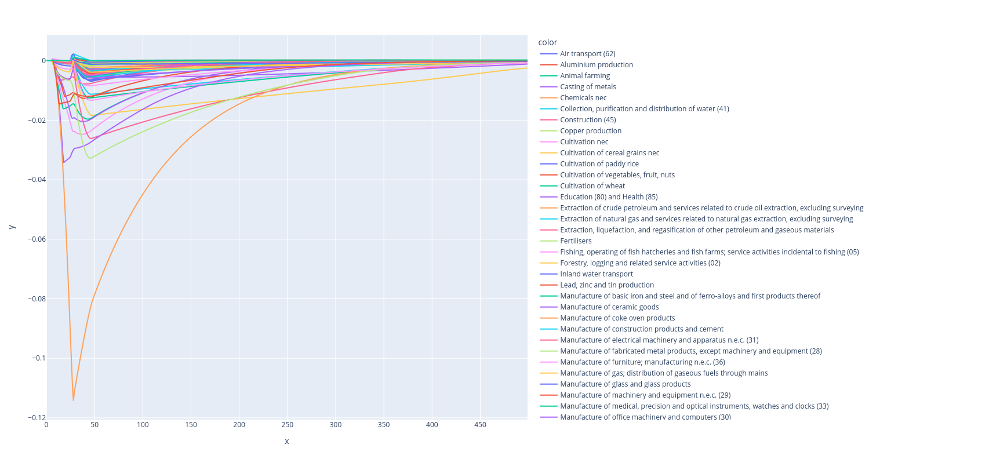

In [6]:
import plotly.express as px

df_stocks = pd.read_feather("./BigScaleTest/results/FR_qdmg_10_0G_Psi_0_9_inv_tau_90/treated_df_stocks.feather")
df_stocks = df_stocks[df_stocks.region=='FR']
#df_stocks = df_stocks[df_stocks.sector=='Manufacture of gas; distribution of gaseous fuels through mains']
#df_stocks
df_stocks = df_stocks.groupby(["step","stock of"]).mean()
df_stocks = df_stocks.reset_index()
df_stocks
fig = px.line(x=df_stocks.step, y=df_stocks.value, color = df_stocks['stock of'])
fig.update_layout(
    autosize=False,
    width=1400,
    height=800,)
fig.show()

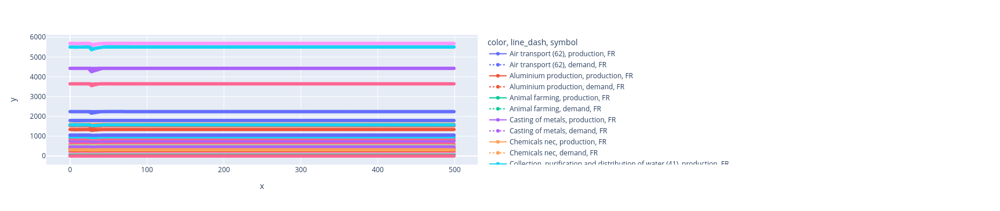

In [14]:
import plotly.express as px
tmp_df = df_prod[(df_prod.variable=='demand') | (df_prod.variable=='production')]
tmp_df = tmp_df[(tmp_df.region=="FR")]
fig = px.line(x=tmp_df.step, y=tmp_df.value, color = tmp_df.sector, line_dash=tmp_df.variable, symbol=tmp_df.region)
fig.show()

In [19]:
import plotly.express as px

sector = 'Construction (45)'
region_selection = ['GB']

dff = df_prod
dff = dff[dff.sector==sector]
dff = dff[dff.step.between(0,49)]
dff = dff[dff.region.isin(region_selection)]
#dff = dff[dff["stock of"].isin(stocks_selection)]
#print(dff.step, dff.value, dff.region, dff.region)
fig = px.line(x=dff.step, y=dff.value, symbol = dff.region, color = dff['stock of'])


AttributeError: 'DataFrame' object has no attribute 'region'

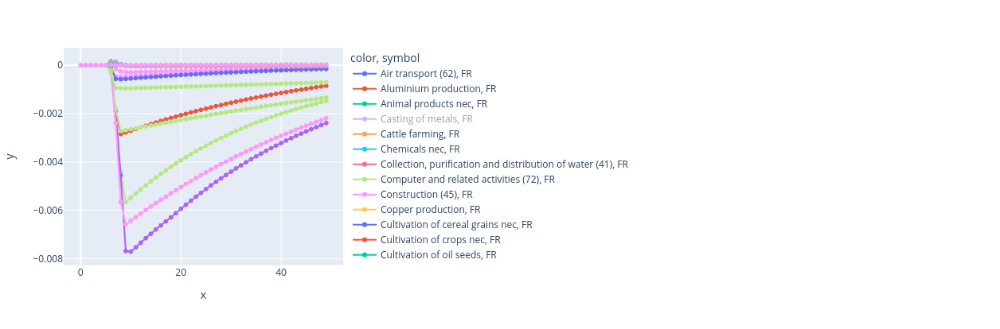

In [41]:
fig.show()

In [10]:
import numpy as np
import pandas as pd
import json
import pathlib

with (pathlib.Path("./BigScaleTest/indexes/indexes.json")).open() as f:
    indexes = json.load(f)

#self.stocks_evolution = np.memmap(result_storage/"stocks_record", dtype='float64', mode="w+", shape=(simulation_params['n_timesteps'], self.n_sectors, self.n_sectors*self.n_regions))
#

data=np.load('./BigScaleTest/results/matrix_stock_dump.pkl', allow_pickle=True)
data.shape

df=pd.DataFrame(data, index=indexes['sectors'], columns=pd.MultiIndex.from_product([indexes["regions"], indexes["sectors"]]))
df

df[df<0].dropna(how='all').dropna(how='all', axis=1)

,WL
,Re-processing of secondary steel into new steel
"Collection, purification and distribution of water (41)",-1.583588e-10


In [74]:
import numpy as np
import pandas as pd
import json
import pathlib

with (pathlib.Path("./BigScaleTest/indexes/indexes.json")).open() as f:
    indexes = json.load(f)

results_path = pathlib.Path("./BigScaleTest/results/BE_qdmg_5_0G_Psi_0_8_inv_tau_40/")

t = 365
steps = [i for i in range(t)]


data = np.memmap(results_path/"limiting_stocks_record", mode='r+', dtype='bool',shape=(t*indexes['n_sectors'],indexes['n_industries']))
limiting = pd.DataFrame(data.reshape(t*indexes["n_sectors"],-1),
                                        index=pd.MultiIndex.from_product([steps, indexes["sectors"]], names=['step', 'stock of']),
                                        columns=pd.MultiIndex.from_product([indexes["regions"], indexes["sectors"]], names = ['region','sector']))

limiting

a = limiting.stack([0,1])
#a.index = a.index.rename(['step','sector', 'region']) #type: ignore
a = a.swaplevel(1,2).swaplevel(2,3)
a

step  region  sector                                                                               stock of               
0     AT      Air transport (62)                                                                   Air transport (62)         False
              Aluminium production                                                                 Air transport (62)         False
              Animal farming                                                                       Air transport (62)         False
              Casting of metals                                                                    Air transport (62)         False
              Chemicals nec                                                                        Air transport (62)         False
                                                                                                                              ...  
364   ZA      Transport via pipelines                                                

In [ ]:
import numpy as np
import pandas as pd
import json
import pathlib

with (pathlib.Path("./BigScaleTest/indexes/indexes.json")).open() as f:
    indexes = json.load(f)

results_path = pathlib.Path("./BigScaleTest/results/GB_qdmg_5_0G_Psi_0_9_inv_tau_90/")

t = 365
steps = [i for i in range(t)]


data = np.memmap(results_path/"prod_share_rebuild_record", mode='r+', dtype='float64',shape=(t,indexes['n_industries']))
prod = pd.DataFrame(data = data, index=pd.Index(steps, name='step'),
                    columns=pd.MultiIndex.from_product([indexes["regions"], indexes["sectors"]], names = ['region','sector']))

display_f(prod[('GB', 'Construction (45)')])

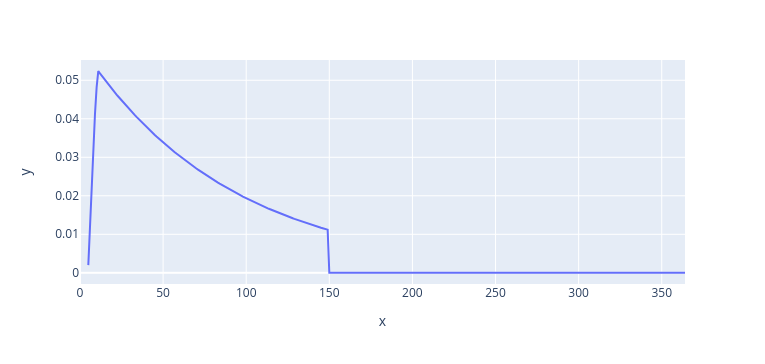

In [33]:
tmp_df = prod[('GB', 'Construction (45)')]
#.groupby(level=1,axis=1).mean()
type(tmp_df)
fig = px.line(x=tmp_df.index, y=tmp_df.values)
fig.show()

In [121]:
X_0 = prod.iloc[0].values
production = prod.iloc[100].values

checker = np.full(production.shape, 0.0)
res = np.full(production.shape, 0.0)
mask = X_0 != 0
np.subtract(X_0, production, out=checker, where=mask)
np.divide(checker, X_0, out=res, where=mask)
np.where(res >= 0.95)[0].size


1654

[(26,
  'BE',
  'Manufacture of office machinery and computers (30)',
  'Sale, maintenance, repair of motor vehicles, motor vehicles parts, motorcycles, motor cycles parts and accessoiries'),
 (26,
  'BE',
  'Retail trade, except of motor vehicles and motorcycles; repair of personal and household goods (52)',
  'Sale, maintenance, repair of motor vehicles, motor vehicles parts, motorcycles, motor cycles parts and accessoiries'),
 (26,
  'BE',
  'Sale, maintenance, repair of motor vehicles, motor vehicles parts, motorcycles, motor cycles parts and accessoiries',
  'Sale, maintenance, repair of motor vehicles, motor vehicles parts, motorcycles, motor cycles parts and accessoiries'),
 (27,
  'BE',
  'Manufacture of furniture; manufacturing n.e.c. (36)',
  'Sale, maintenance, repair of motor vehicles, motor vehicles parts, motorcycles, motor cycles parts and accessoiries'),
 (27,
  'BE',
  'Manufacture of medical, precision and optical instruments, watches and clocks (33)',
  'Sale, mainte